# 1

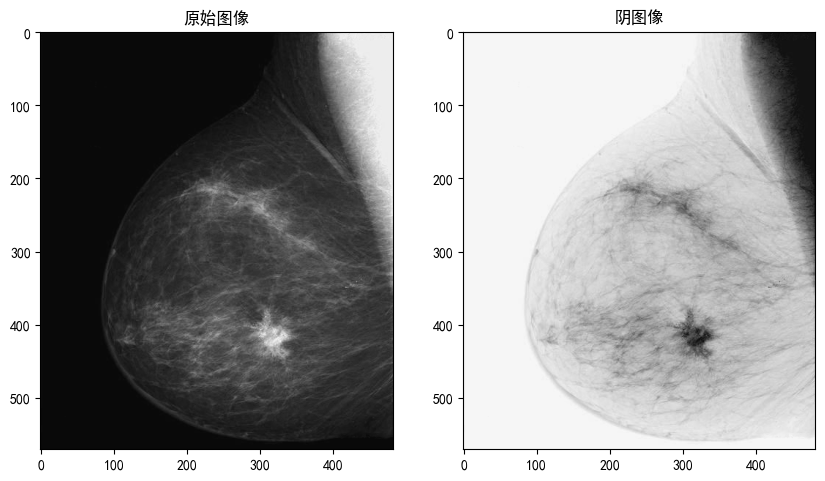

保存质量因子为10的JPEG图像
保存质量因子为30的JPEG图像
保存质量因子为50的JPEG图像
保存质量因子为70的JPEG图像
保存质量因子为90的JPEG图像
不同质量因子下的JPEG图像文件大小：
质量因子为10的JPEG图像文件大小为5038字节
质量因子为30的JPEG图像文件大小为10077字节
质量因子为50的JPEG图像文件大小为14366字节
质量因子为70的JPEG图像文件大小为19975字节
质量因子为90的JPEG图像文件大小为38809字节


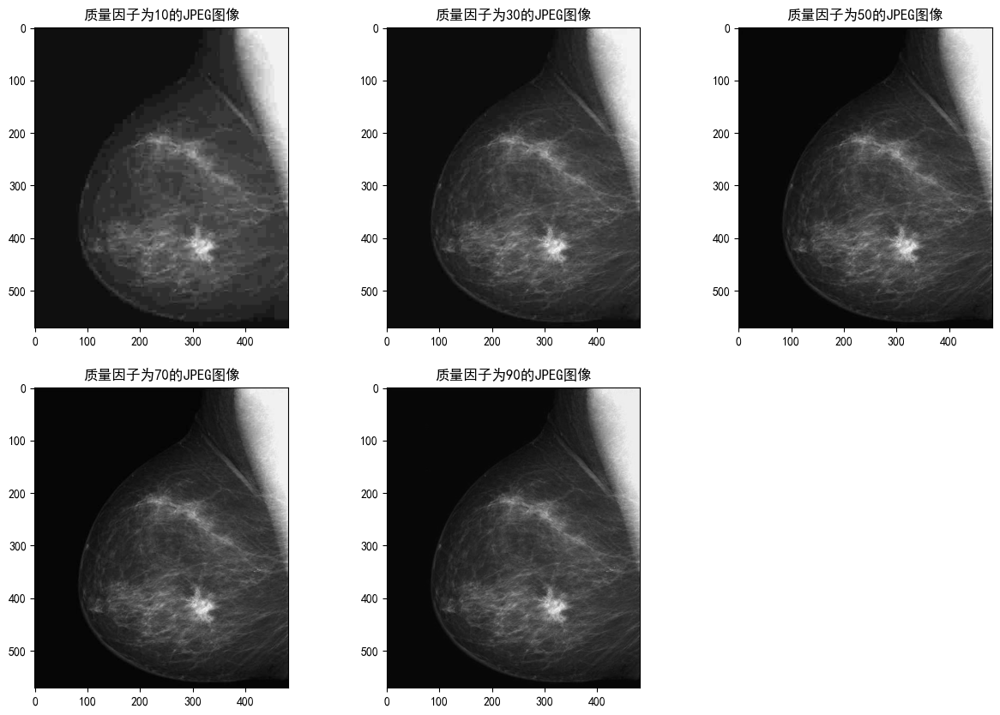

In [6]:
from PIL import Image
import os
import numpy as np
from matplotlib import pyplot as plt
from pylab import mpl
# 设置显示中文字体
mpl.rcParams["font.sans-serif"] = ["SimHei"]

# 加载图像
image_path = './data/breast.tif'
image = Image.open(image_path)

# 阴图像
img_np = np.array(image)
img_np_neg = 255 - img_np

plt.figure(figsize=(10, 10))
plt.subplot(121)

plt.title('原始图像')
plt.imshow(img_np, cmap='gray')
plt.subplot(122)

plt.title('阴图像')
plt.imshow(img_np_neg, cmap='gray')
plt.show()

# 定义保存JPEG图像的不同质量因子
quality_factors = [10, 30, 50, 70, 90]

# 创建保存JPEG图像的文件夹
if not os.path.exists('./JPEG_images'):
    os.makedirs('./JPEG_images')

# 保存JPEG图像
results = []
for quality in quality_factors:
    output_path = f'./JPEG_images/breast_{quality}.jpg'
    image.save(output_path, quality=quality)
    print(f'保存质量因子为{quality}的JPEG图像')
    file_size = os.path.getsize(output_path)
    results.append((quality, file_size))

print('不同质量因子下的JPEG图像文件大小：')
for quality, file_size in results:
    print(f'质量因子为{quality}的JPEG图像文件大小为{file_size}字节')

# 对比不同质量因子下的JPEG图像
plt.figure(figsize=(15, 10))
for i, quality in enumerate(quality_factors):
    img_jpeg = Image.open(f'./JPEG_images/breast_{quality}.jpg')
    img_jpeg_np = np.array(img_jpeg)
    plt.subplot(2, 3, i+1)
    plt.title(f'质量因子为{quality}的JPEG图像')
    plt.imshow(img_jpeg_np, cmap='gray')
plt.show()

从图像和表中可以看出，随着质量因子的增加，JPEG图像的文件大小也相应增加。质量因子越高，图像的质量越好，同时文件大小也越大。

# 2

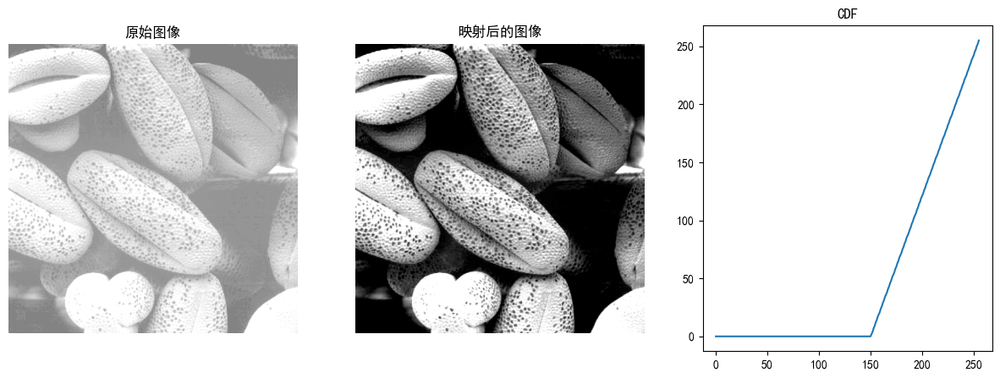

In [71]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pylab import mpl
# 设置显示中文字体
mpl.rcParams["font.sans-serif"] = ["SimHei"]


# 加载图像
image_path = './data/pollen2.tif'
image = Image.open(image_path).convert('L')

# 转换为numpy数组
image_array = np.array(image)

# 定义分段映射函数
def segmented_mapping(x):
    if x <= 150:
        return 0
    else:
        return min((x - 150) / (255 - 150) * 255, 255)

# 向量化映射函数
vectorized_mapping = np.vectorize(segmented_mapping)

# 应用映射函数
enhanced_image_array = vectorized_mapping(image_array).astype(np.uint8)

# 显示原始图像和增强后的图像
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title('原始图像')
plt.imshow(image_array, cmap='gray', vmin=0, vmax=255)
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title('映射后的图像')
plt.imshow(enhanced_image_array, cmap='gray', vmin=0, vmax=255)
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title('CDF')
x = np.linspace(0, 255, 256)
y = vectorized_mapping(x)
plt.plot(x, y)

plt.show()



# 3


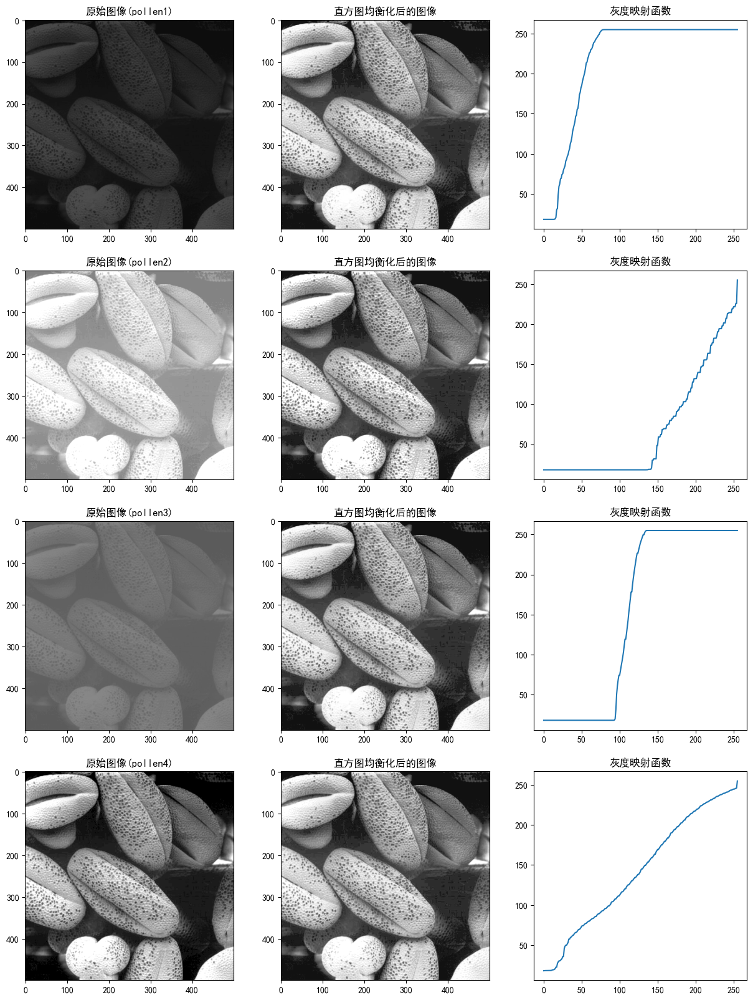

In [73]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.exposure import cumulative_distribution
from PIL import Image
from pylab import mpl
# 设置显示中文字体
mpl.rcParams["font.sans-serif"] = ["SimHei"]


def equalize(image_path):
    image = Image.open(image_path).convert('L')

    # 转换为numpy数组
    image_array = np.array(image)
    cdf, bin_centers = cumulative_distribution(image_array)
    out = np.interp(image_array.flat, bin_centers, cdf)
    equalized_image_array = out.reshape(image_array.shape)
    return image_array, equalized_image_array, cdf, bin_centers

# 显示原始图像和直方图均衡化后的图像
plt.figure(figsize=(15, 20))

for i in range(1, 5):
    image_path = f'./data/pollen{i}.tif'
    img, a, f, c = equalize(image_path=image_path)
    
    plt.subplot(4, 3, 3 * i - 2)
    plt.title(f'原始图像(pollen{i})')
    plt.imshow(img, cmap='gray', vmin=0, vmax=255)
    plt.subplot(4, 3, 3 * i - 1)
    plt.title('直方图均衡化后的图像')
    plt.imshow(a, cmap='gray', vmin=0, vmax=1)
    plt.subplot(4, 3, 3 * i)
    plt.title('灰度映射函数')
    plt.plot(np.concatenate((np.array([0]), c, np.array([255]),)), np.concatenate((f[0:1], f, f[-1:])) * 255)

plt.show()

由图，对比第一列和第二列，可以发现均衡化后的图像对比度明显提高，细节更加清晰。



由灰度映射函数可以看出：pollen1灰度值集中在较暗区域，pollen2在较亮区域，pollen3在100-130之间，而pollen4则不够线性均匀。经过灰度映射函数，图像的灰度值分布更加均匀，变化更加线性。

## 4

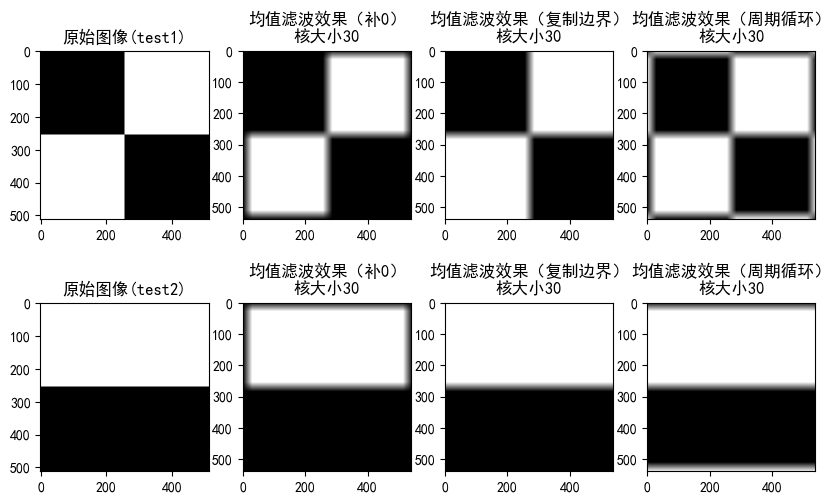

In [14]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pylab import mpl
import cv2
# 设置显示中文字体
mpl.rcParams["font.sans-serif"] = ["SimHei"]


def extend(image, padding_type, border_size=1):
    h, w = image.shape
    if padding_type == 'zero_pad':
        extended_image = np.zeros((h + 2 * border_size, w + 2 * border_size))
        extended_image[border_size:h + border_size, border_size:w + border_size] = image
    elif padding_type == 'border_replicate':
        extended_image = cv2.copyMakeBorder(image, border_size, border_size, border_size, border_size, cv2.BORDER_REPLICATE)
    elif padding_type == 'border_wrap':
        extended_image = cv2.copyMakeBorder(image, border_size, border_size, border_size, border_size, cv2.BORDER_WRAP)
    return extended_image
    

def filter(image_path, padding_type, kernel_size=3):
    image = Image.open(image_path).convert('L')
    image = np.array(image)
    extended_image = extend(image, padding_type, border_size=(kernel_size-1)//2)
    return cv2.blur(extended_image, (kernel_size, kernel_size))

# 显示原始图像和直方图均衡化后的图像
plt.figure(figsize=(10, 6))

for i in range(1, 3):
    image_path = f'./data/test{i}.bmp'
    img = Image.open(image_path).convert('L')
    kernel_size = 30
    img1 = filter(image_path, 'zero_pad', kernel_size)
    img2 = filter(image_path, 'border_replicate', kernel_size)
    img3 = filter(image_path, 'border_wrap', kernel_size)

    
    plt.subplot(2, 4, 4 * i - 3)
    plt.title(f'原始图像(test{i})')
    plt.imshow(img, cmap='gray')
    plt.subplot(2, 4, 4 * i - 2)
    plt.title(f'均值滤波效果（补0）\n核大小{kernel_size}')
    plt.imshow(img1, cmap='gray')
    plt.subplot(2, 4, 4 * i - 1)
    plt.title(f'均值滤波效果（复制边界）\n核大小{kernel_size}')
    plt.imshow(img2, cmap='gray')
    plt.subplot(2, 4, 4 * i)
    plt.title(f'均值滤波效果（周期循环）\n核大小{kernel_size}')
    plt.imshow(img3, cmap='gray')

plt.show()

补0补充方式会导致边界处均值计算包含大量0值，从而使得边界处出现明显的褐色条纹
复制边界方式会使得边界处的像素值与边界处的像素值相同，过渡比较自然
周期循环方式会使得边界处的像素值变为相对边的像素值，若相对边边界处的像素值相近，则过渡比较自然；若相对边界处的像素值差异较大，则过渡不自然。


## 5

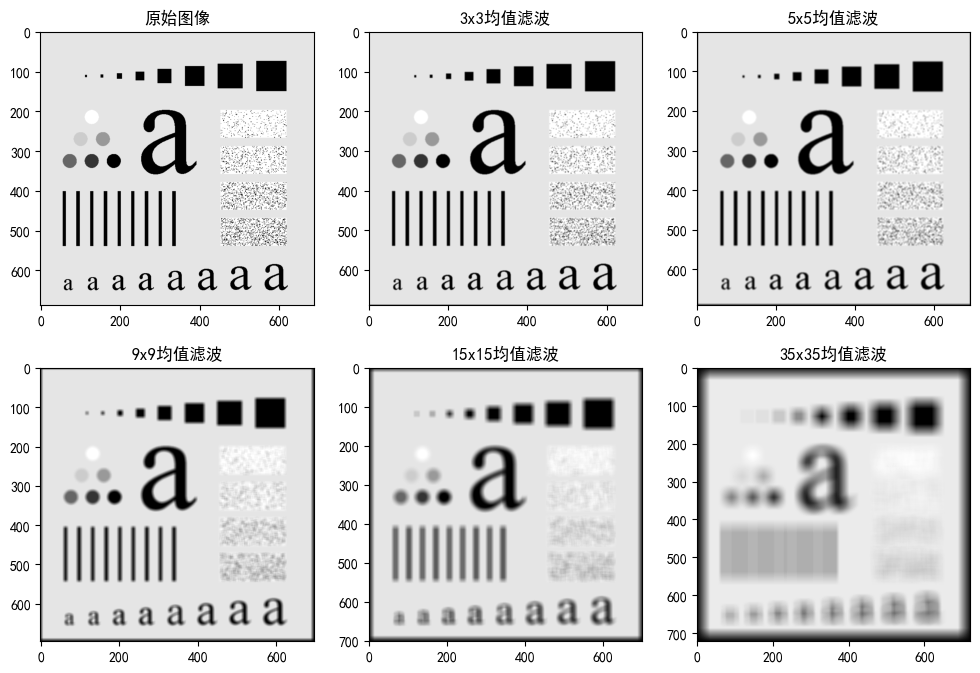

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pylab import mpl
import cv2
# 设置显示中文字体
mpl.rcParams["font.sans-serif"] = ["SimHei"]


def filter(image_path, padding_type, kernel_size=3):
    image = Image.open(image_path).convert('L')
    image = np.array(image)
    extended_image = extend(image, padding_type, border_size=(kernel_size-1)//2)
    return cv2.blur(extended_image, (kernel_size, kernel_size))

# 显示原始图像和直方图均衡化后的图像
plt.figure(figsize=(12, 8))

kernel_sizes = [3, 5, 9, 15, 35]
image_path = './data/test3.tif'
img = Image.open(image_path).convert('L')


plt.subplot(2, 3, 1)
plt.title(f'原始图像')
plt.imshow(img, cmap='gray')

for i in range(5):
    kernel_size = kernel_sizes[i]
    img1 = filter(image_path, 'zero_pad', kernel_size)
    plt.subplot(2, 3, i+2)
    plt.title(f'{kernel_size}x{kernel_size}均值滤波')
    plt.imshow(img1, cmap='gray')

plt.show()

3x3和5x5滤波器可以一定程度上去除图像中的噪声，保留更多细节；9x9和15x15滤波器可以更好地去除噪声，但是线条和较小文本也被模糊掉了。35x35滤波器去除了大部分噪声，但是图像变得非常模糊，细节丢失严重，只保留大致轮廓。

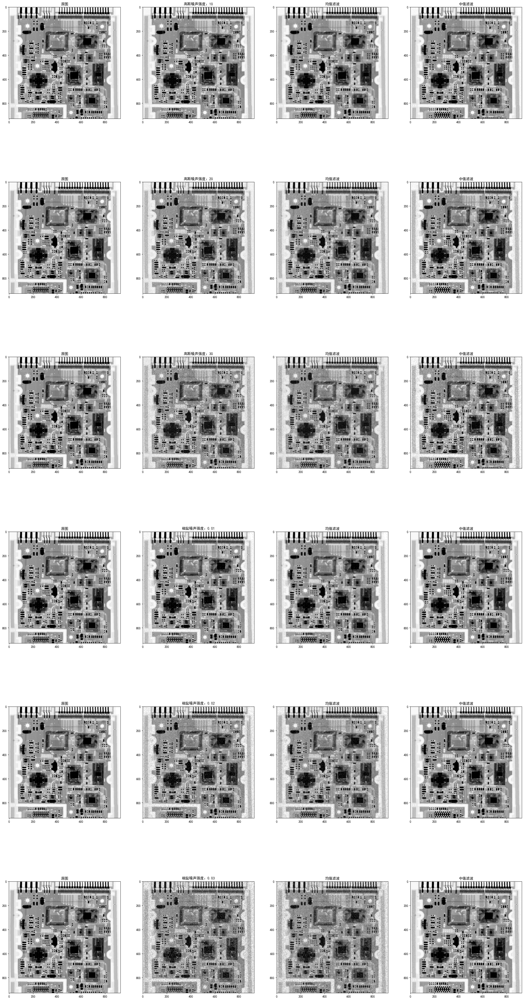

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pylab import mpl
import cv2
# 设置显示中文字体
mpl.rcParams["font.sans-serif"] = ["SimHei"]

# 加载图像
image_path = './data/ic.bmp'  # 更新为正确的路径
image = Image.open(image_path).convert('L')

# 转换为numpy数组
image_array = np.array(image)


# 添加高斯噪声
def add_gaussian_noise(image, mean=0, std=25):
    gaussian_noise = np.random.normal(mean, std, image.shape)
    noisy_image = image + gaussian_noise
    noisy_image = np.clip(noisy_image, 0, 255)
    return noisy_image.astype(np.uint8)

# 添加椒盐噪声
def add_salt_and_pepper_noise(image, salt_prob=0.02, pepper_prob=0.02):
    noisy_image = image.copy()
    num_salt = np.ceil(salt_prob * image.size)
    num_pepper = np.ceil(pepper_prob * image.size)
    
    # 添加盐噪声
    coords = [np.random.randint(0, i - 1, int(num_salt)) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 255
    
    # 添加椒噪声
    coords = [np.random.randint(0, i - 1, int(num_pepper)) for i in image.shape]
    noisy_image[coords[0], coords[1]] = 0
    
    return noisy_image

# 应用均值滤波器
def apply_mean_filter(image, kernel_size=3):
    return cv2.blur(image, (kernel_size, kernel_size))

# 应用中值滤波器
def apply_median_filter(image, kernel_size=3):
    return cv2.medianBlur(image, kernel_size)

# 生成不同强度的噪声图像
gaussian_noisy_images = [add_gaussian_noise(image_array, std=std) for std in [10, 30, 50]]
salt_pepper_noisy_images = [add_salt_and_pepper_noise(image_array, salt_prob=prob, pepper_prob=prob) for prob in [0.01, 0.05, 0.1]]

plt.figure(figsize=(30, 60))
for i, noisy_image in enumerate(gaussian_noisy_images + salt_pepper_noisy_images):
    if i < 3:
        noise_type = '高斯噪声'
    else:
        noise_type = '椒盐噪声'
    plt.subplot(6, 4, 4 * i + 1)
    plt.title('原图')
    plt.imshow(image_array, cmap='gray')
    plt.subplot(6, 4, 4 * i + 2)
    plt.title(f'{noise_type}强度：{10 * (i % 3) + 10 if i < 3 else 0.01 * (i % 3 + 1)}')
    plt.imshow(noisy_image, cmap='gray')
    
    img_mean = apply_mean_filter(noisy_image, kernel_size=5)
    img_median = apply_median_filter(noisy_image, kernel_size=3)

    plt.subplot(6, 4, 4 * i + 3)
    plt.title('均值滤波')
    plt.imshow(img_mean, cmap='gray')
    plt.subplot(6, 4, 4 * i + 4)
    plt.title('中值滤波')
    plt.imshow(img_median, cmap='gray')
# # 显示原始图像和直方图均衡化后的图像
# plt.figure(figsize=(12, 8))

# kernel_sizes = [3, 5, 9, 15, 35]
# image_path = './data/test3.tif'
# img = Image.open(image_path).convert('L')


# plt.subplot(2, 3, 1)
# plt.title(f'原始图像')
# plt.imshow(img, cmap='gray')

# for i in range(5):
#     kernel_size = kernel_sizes[i]
#     img1 = filter(image_path, 'zero_pad', kernel_size)
#     plt.subplot(2, 3, i+2)
#     plt.title(f'{kernel_size}x{kernel_size}均值滤波')
#     plt.imshow(img1, cmap='gray')

# plt.show()